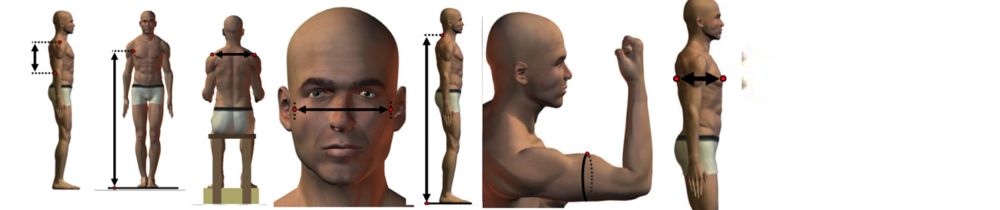

# WELCOME!

In this project, you must apply EDA processes for the development of predictive models. Handling outliers, domain knowledge and feature engineering will be challenges.

Also, this project aims to improve your ability to implement algorithms for Multi-Class Classification. Thus, you will have the opportunity to implement many algorithms commonly used for Multi-Class Classification problems.

Before diving into the project, please take a look at the determines and tasks.

# Determines

The 2012 US Army Anthropometric Survey (ANSUR II) was executed by the Natick Soldier Research, Development and Engineering Center (NSRDEC) from October 2010 to April 2012 and is comprised of personnel representing the total US Army force to include the US Army Active Duty, Reserves, and National Guard. In addition to the anthropometric and demographic data described below, the ANSUR II database also consists of 3D whole body, foot, and head scans of Soldier participants. These 3D data are not publicly available out of respect for the privacy of ANSUR II participants. The data from this survey are used for a wide range of equipment design, sizing, and tariffing applications within the military and has many potential commercial, industrial, and academic applications.

The ANSUR II working databases contain 93 anthropometric measurements which were directly measured, and 15 demographic/administrative variables explained below. The ANSUR II Male working database contains a total sample of 4,082 subjects. The ANSUR II Female working database contains a total sample of 1,986 subjects.


DATA DICT:
https://data.world/datamil/ansur-ii-data-dictionary/workspace/file?filename=ANSUR+II+Databases+Overview.pdf

---

To achieve high prediction success, you must understand the data well and develop different approaches that can affect the dependent variable.

Firstly, try to understand the dataset column by column using pandas module. Do research within the scope of domain (body scales, and race characteristics) knowledge on the internet to get to know the data set in the fastest way. 

You will implement ***Logistic Regression, Support Vector Machine, XGBoost, Random Forest*** algorithms. Also, evaluate the success of your models with appropriate performance metrics.

At the end of the project, choose the most successful model and try to enhance the scores with ***SMOTE*** make it ready to deploy. Furthermore, use ***SHAP*** to explain how the best model you choose works.

# Tasks

#### 1. Exploratory Data Analysis (EDA)
- Import Libraries, Load Dataset, Exploring Data

    *i. Import Libraries*
    
    *ii. Ingest Data *
    
    *iii. Explore Data*
    
    *iv. Outlier Detection*
    
    *v.  Drop unnecessary features*

#### 2. Data Preprocessing
- Scale (if needed)
- Separete the data frame for evaluation purposes

#### 3. Multi-class Classification
- Import libraries
- Implement SVM Classifer
- Implement Decision Tree Classifier
- Implement Random Forest Classifer
- Implement XGBoost Classifer
- Compare The Models



# EDA
- Drop unnecessary colums
- Drop DODRace class if value count below 500 (we assume that our data model can't learn if it is below 500)

## Import Libraries
Besides Numpy and Pandas, you need to import the necessary modules for data visualization, data preprocessing, Model building and tuning.

*Note: Check out the course materials.*

In [168]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler,StandardScaler

from sklearn.metrics import accuracy_score,f1_score, classification_report,confusion_matrix,make_scorer
from sklearn.metrics import  recall_score, precision_score, roc_auc_score, auc,precision_recall_curve,roc_curve
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold,KFold
from sklearn.neighbors import KNeighborsClassifier
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall

from yellowbrick.classifier import ClassPredictionError, ROCAUC
from sklearn.preprocessing import  LabelEncoder,OrdinalEncoder
from sklearn.pipeline import Pipeline

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

plt.rcParams["figure.figsize"] = (5,3.5)
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

## Ingest Data from links below and make a dataframe
- Soldiers Male : https://query.data.world/s/h3pbhckz5ck4rc7qmt2wlknlnn7esr
- Soldiers Female : https://query.data.world/s/sq27zz4hawg32yfxksqwijxmpwmynq

In [2]:
pd.set_option('display.max_columns', None)
df1 = pd.read_csv('ANSUR II MALE Public.csv', encoding='ISO-8859-1')
df1_copy = df1.copy()
df1.head()

,subjectid,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,bicristalbreadth,bideltoidbreadth,bimalleolarbreadth,bitragionchinarc,bitragionsubmandibulararc,bizygomaticbreadth,buttockcircumference,buttockdepth,buttockheight,buttockkneelength,buttockpopliteallength,calfcircumference,cervicaleheight,chestbreadth,chestcircumference,chestdepth,chestheight,crotchheight,crotchlengthomphalion,crotchlengthposterioromphalion,earbreadth,earlength,earprotrusion,elbowrestheight,eyeheightsitting,footbreadthhorizontal,footlength,forearmcenterofgriplength,forearmcircumferenceflexed,forearmforearmbreadth,forearmhandlength,functionalleglength,handbreadth,handcircumference,handlength,headbreadth,headcircumference,headlength,heelanklecircumference,heelbreadth,hipbreadth,hipbreadthsitting,iliocristaleheight,interpupillarybreadth,interscyei,interscyeii,kneeheightmidpatella,kneeheightsitting,lateralfemoralepicondyleheight,lateralmalleolusheight,lowerthighcircumference,mentonsellionlength,neckcircumference,neckcircumferencebase,overheadfingertipreachsitting,palmlength,poplitealheight,radialestylionlength,shouldercircumference,shoulderelbowlength,shoulderlength,sittingheight,sleevelengthspinewrist,sleeveoutseam,span,stature,suprasternaleheight,tenthribheight,thighcircumference,thighclearance,thumbtipreach,tibialheight,tragiontopofhead,trochanterionheight,verticaltrunkcircumferenceusa,waistbacklength,waistbreadth,waistcircumference,waistdepth,waistfrontlengthsitting,waistheightomphalion,weightkg,wristcircumference,wristheight,Gender,Date,Installation,Component,Branch,PrimaryMOS,SubjectsBirthLocation,SubjectNumericRace,Ethnicity,DODRace,Age,Heightin,Weightlbs,WritingPreference
0,10027,266,1467,337,222,1347,253,202,401,369,274,493,71,319,291,142,979,240,882,619,509,373,1535,291,1074,259,1292,877,607,351,36,71,19,247,802,101,273,349,299,575,477,1136,90,214,193,150,583,206,326,70,332,366,1071,685,422,441,502,560,500,77,391,118,400,436,1447,113,437,273,1151,368,145,928,883,600,1782,1776,1449,1092,610,164,786,491,140,919,1700,501,329,933,240,440,1054,815,175,853,Male,4-Oct-10,Fort Hood,Regular Army,Combat Arms,19D,North Dakota,1,NaN,1,41,71,180,Right hand
1,10032,233,1395,326,220,1293,245,193,394,338,257,479,67,344,320,135,944,232,870,584,468,357,1471,269,1021,253,1244,851,615,376,33,62,18,232,781,98,263,348,289,523,476,1096,86,203,195,146,568,201,334,72,312,356,1046,620,441,447,490,540,488,73,371,131,380,420,1380,118,417,254,1119,353,141,884,868,564,1745,1702,1387,1076,572,169,822,476,120,918,1627,432,316,870,225,371,1054,726,167,815,Male,4-Oct-10,Fort Hood,Regular Army,Combat Support,68W,New York,1,NaN,1,35,68,160,Left hand
2,10033,287,1430,341,230,1327,256,196,427,408,261,544,75,345,330,135,1054,258,901,623,506,412,1501,288,1120,267,1288,854,636,359,40,61,23,237,810,103,270,355,357,575,491,1115,93,220,203,148,573,202,356,70,349,393,1053,665,462,475,496,556,482,72,409,123,403,434,1447,121,431,268,1276,367,167,917,910,604,1867,1735,1438,1105,685,198,807,477,125,918,1678,472,329,964,255,411,1041,929,180,831,Male,4-Oct-10,Fort Hood,Regular Army,Combat Support,68W,New York,2,NaN,2,42,68,205,Left hand
3,10092,234,1347,310,230,1239,262,199,401,359,262,518,73,328,309,143,991,242,821,560,437,395,1423,296,1114,262,1205,769,590,341,39,66,25,272,794,106,267,352,318,593,467,1034,91,217,194,158,576,199,341,68,338,367,986,640,458,461,460,511,452,76,393,106,407,446,1357,118,393,249,1155,330,148,903,848,550,1708,1655,1346,1021,604,180,803,445,127,847,1625,461,315,857,205,399,968,794,176,793,Male,12-Oct-10,Fort Hood,Regular Army,Combat Service Support,88M,Wisconsin,1,NaN,1,31,66,175,Right hand
4,10093,250,1585,372,247,1478,267,224,435,356,263,524,80,340,310,138,1029,275,1080,706,567,425,1684,304,1048,232,1452,1014,682,382,32,56,19,188,814,111,305,399,324,605,550,1279,94,222,218,153,566,197,374,69,332,372,1251,675,481,505,612,666,585,85,458

In [3]:
df2 = pd.read_csv('ANSUR II FEMALE Public.csv', encoding='ISO-8859-1')
df2_copy = df2.copy()
df2.head()

,SubjectId,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,bicristalbreadth,bideltoidbreadth,bimalleolarbreadth,bitragionchinarc,bitragionsubmandibulararc,bizygomaticbreadth,buttockcircumference,buttockdepth,buttockheight,buttockkneelength,buttockpopliteallength,calfcircumference,cervicaleheight,chestbreadth,chestcircumference,chestdepth,chestheight,crotchheight,crotchlengthomphalion,crotchlengthposterioromphalion,earbreadth,earlength,earprotrusion,elbowrestheight,eyeheightsitting,footbreadthhorizontal,footlength,forearmcenterofgriplength,forearmcircumferenceflexed,forearmforearmbreadth,forearmhandlength,functionalleglength,handbreadth,handcircumference,handlength,headbreadth,headcircumference,headlength,heelanklecircumference,heelbreadth,hipbreadth,hipbreadthsitting,iliocristaleheight,interpupillarybreadth,interscyei,interscyeii,kneeheightmidpatella,kneeheightsitting,lateralfemoralepicondyleheight,lateralmalleolusheight,lowerthighcircumference,mentonsellionlength,neckcircumference,neckcircumferencebase,overheadfingertipreachsitting,palmlength,poplitealheight,radialestylionlength,shouldercircumference,shoulderelbowlength,shoulderlength,sittingheight,sleevelengthspinewrist,sleeveoutseam,span,stature,suprasternaleheight,tenthribheight,thighcircumference,thighclearance,thumbtipreach,tibialheight,tragiontopofhead,trochanterionheight,verticaltrunkcircumferenceusa,waistbacklength,waistbreadth,waistcircumference,waistdepth,waistfrontlengthsitting,waistheightomphalion,weightkg,wristcircumference,wristheight,Gender,Date,Installation,Component,Branch,PrimaryMOS,SubjectsBirthLocation,SubjectNumericRace,Ethnicity,DODRace,Age,Heightin,Weightlbs,WritingPreference
0,10037,231,1282,301,204,1180,222,177,373,315,263,466,65,338,301,141,1011,223,836,587,476,360,1336,274,922,245,1095,759,557,310,35,65,16,220,713,91,246,316,265,517,432,1028,75,182,184,141,548,191,314,69,345,388,966,645,363,399,435,496,447,55,404,118,335,368,1268,113,362,235,1062,327,148,803,809,513,1647,1560,1280,1013,622,174,736,430,110,844,1488,406,295,850,217,345,942,657,152,756,Female,5-Oct-10,Fort Hood,Regular Army,Combat Support,92Y,Germany,2,NaN,2,26,61,142,Right hand
1,10038,194,1379,320,207,1292,225,178,372,272,250,430,64,294,270,126,893,186,900,583,483,350,1440,261,839,206,1234,835,549,329,32,60,23,208,726,91,249,341,247,468,463,1117,78,187,189,138,535,180,307,60,315,335,1048,595,340,375,483,532,492,69,334,115,302,345,1389,110,426,259,1014,346,142,835,810,575,1751,1665,1372,1107,524,152,771,475,125,901,1470,422,254,708,168,329,1032,534,155,815,Female,5-Oct-10,Fort Hood,Regular Army,Combat Service Support,25U,California,3,Mexican,3,21,64,120,Right hand
2,10042,183,1369,329,233,1271,237,196,397,300,276,450,69,309,270,128,987,204,861,583,466,384,1451,287,874,223,1226,821,643,374,36,65,26,204,790,100,265,343,262,488,469,1060,84,198,195,146,588,207,331,70,356,399,1043,655,345,399,470,530,469,64,401,135,325,369,1414,122,398,258,1049,362,164,904,855,568,1779,1711,1383,1089,577,164,814,458,129,882,1542,419,269,727,159,367,1035,663,162,799,Female,5-Oct-10,Fort Hood,Regular Army,Combat Service Support,35D,Texas,1,NaN,1,23,68,147,Right hand
3,10043,261,1356,306,214,1250,240,188,384,364,276,484,68,340,294,144,1012,253,897,599,471,372,1430,269,1008,285,1170,804,640,351,38,62,22,244,775,97,265,331,309,529,455,1069,80,192,186,153,593,206,332,68,337,402,1029,655,392,435,469,520,478,67,402,118,357,386,1329,115,394,250,1121,333,157,875,815,536,1708,1660,1358,1065,679,187,736,463,125,866,1627,451,302,923,235,371,999,782,173,818,Female,5-Oct-10,Fort Hood,Regular Army,Combat Service Support,25U,District of Columbia,8,Caribbean Islander,2,22,66,175,Right hand
4,10051,309,1303,308,214,1210,217,182,378,320,336,525,67,300,295,135,1281,284,811,607,467,433,1362,305,1089,290,1112,726,686,356,34,65,18,233,732,88,247,339,260,596,447,1039,78,183,187,140,522,181,308,63

In [4]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4082 entries, 0 to 4081
Columns: 108 entries, subjectid to WritingPreference
dtypes: int64(99), object(9)
memory usage: 3.4+ MB


In [5]:
pd.set_option('display.max_rows', None)
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
subjectid,4082.0,20003.370897,6568.435122,10027.0,14270.25,17236.5,27315.75,29452.0
abdominalextensiondepthsitting,4082.0,254.650906,37.327178,163.0,227.00,251.0,279.00,451.0
acromialheight,4082.0,1440.736894,63.287242,1194.0,1398.00,1439.0,1481.00,1683.0
acromionradialelength,4082.0,335.244488,17.482795,270.0,324.00,335.0,346.00,393.0
anklecircumference,4082.0,229.343949,14.649102,156.0,219.25,228.0,239.00,293.0
axillaheight,4082.0,1329.082068,59.516123,1106.0,1289.00,1328.0,1367.00,1553.0
balloffootcircumference,4082.0,252.017148,12.936131,186.0,243.00,252.0,261.00,306.0
balloffootlength,4082.0,200.935081,10.470947,156.0,194.00,201.0,208.00,245.0
biacromialbreadth,4082.0,415.675649,19.161654,337.0,403.00,415.0,428.00,489.0
bicepscircumferenceflexed,4082.0,358.135718,34.618093,246.0,335.00,357.0,380.00,490.0


# EDA
- Drop unnecessary colums
- Drop DODRace class if value count below 500 (we assume that our data model can't learn if it is below 500)

In [6]:
missing_count = df1.isnull().sum()
value_count = df1.isnull().count()
missing_percentage = round(missing_count / value_count * 100, 2)
missing_df = pd.DataFrame({"count": missing_count, "percentage":missing_percentage})

missing_df[missing_df['count'] >0]

,count,percentage
Ethnicity,3180,77.9


In [7]:
df1.duplicated().sum()

0

In [8]:
df1.DODRace.value_counts()

DODRace
1    2817
2     642
3     440
4     117
6      34
5      29
8       3
Name: count, dtype: int64

In [9]:
df1.DODRace.value_counts(normalize = True)

DODRace
1    0.690103
2    0.157276
3    0.107790
4    0.028662
6    0.008329
5    0.007104
8    0.000735
Name: proportion, dtype: float64

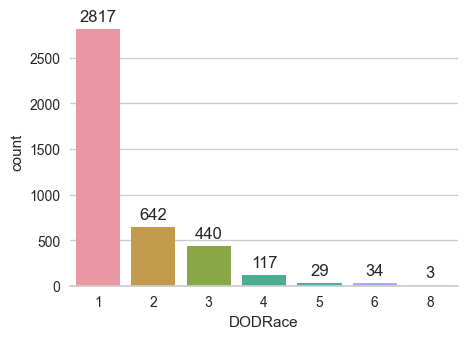

In [10]:
ax = sns.countplot(x='DODRace', data=df1)

# Remove the frame
sns.despine(ax=ax, left=True)

# Add the numbers on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')

# Show the plot
plt.show()

In [11]:
df1.SubjectsBirthLocation.nunique()

126

In [12]:
df1.SubjectNumericRace.nunique()

36

In [13]:
df1.groupby('DODRace').SubjectsBirthLocation.value_counts()

DODRace  SubjectsBirthLocation 
1        New York                  207
         Indiana                   191
         California                184
         Texas                     166
         Oklahoma                  158
         Minnesota                 112
         Michigan                   98
         Florida                    95
         Illinois                   89
         Ohio                       87
         Massachusetts              76
         Alabama                    68
         Mississippi                68
         North Carolina             65
         Pennsylvania               64
         South Carolina             59
         Missouri                   57
         Louisiana                  55
         Georgia                    54
         Wisconsin                  49
         Kansas                     45
         Colorado                   43
         Arizona                    43
         Virginia                   43
         Kentucky               

In [14]:
df1.groupby('SubjectsBirthLocation').Ethnicity.value_counts()

SubjectsBirthLocation   Ethnicity                                
Alabama                 Cherokee                                      1
Alaska                  Puerto Rican                                  1
American Samoa          Samoan                                        3
Arizona                 Mexican                                       7
                        Mexican Yaqui                                 1
                        Korean                                        1
                        Japanese                                      1
                        Filipino                                      1
                        Chilean Mexican                               1
                        Chickasaw                                     1
                        Cherokee                                      1
                        Caribbean Islander Mexican                    1
                        Apache                                        

In [15]:
df1.groupby('DODRace').SubjectNumericRace.value_counts()

DODRace  SubjectNumericRace
1        1                     2643
         51                      70
         31                      36
         41                      14
         3                       11
         61                      10
         8                        8
         18                       8
         21                       8
         351                      2
         251                      2
         4                        1
         38                       1
         318                      1
         431                      1
         451                      1
2        2                      502
         8                       48
         21                      23
         23                      16
         28                      15
         251                     10
         25                       7
         3                        5
         38                       4
         18                       2
         42                       2


#####  1 = White, 2 = Black, 3 = Hispanic, 4 = Asian, 5 = Native American, 6 = Pacific Islander, 8 = Other

In [16]:
df1.groupby(['DODRace','SubjectNumericRace']).Ethnicity.value_counts()

DODRace  SubjectNumericRace  Ethnicity                                
1        3                   Mexican                                        4
                             Puerto Rican                                   3
                             Peruvian                                       2
                             Colombian                                      1
                             Costa Rican Cuban                              1
         4                   Hmong                                          1
         8                   Arab or Middle Eastern                         5
                             Armenian                                       1
                             Azorean                                        1
                             East/Asian Indian                              1
         18                  Arab or Middle Eastern                         4
                             Caribbean Islander                        

In [17]:
missing_count = df1.isnull().sum()
value_count = df1.isnull().count()
missing_percentage = round(missing_count / value_count * 100, 2)
missing_df = pd.DataFrame({"count": missing_count, "percentage":missing_percentage})

missing_df[missing_df['count'] >0]

,count,percentage
Ethnicity,3180,77.9


Comparing heights self reported and measured to see how trustful the self reported values are

In [18]:
df1['heightmm'] = df1.Heightin*25.4

In [19]:
df1.stature.max(),df1.heightmm.max()

(1993, 2387.6)

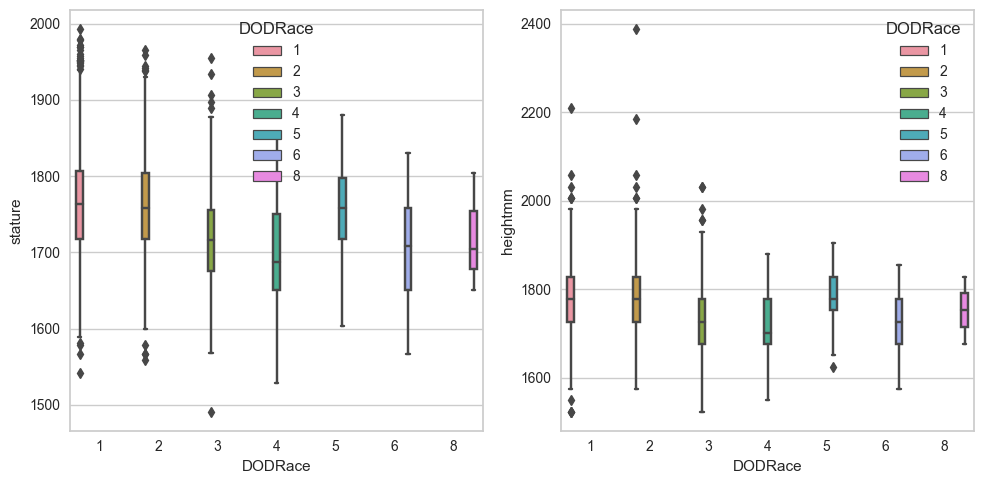

In [20]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
sns.boxplot(data=df1, x='DODRace', y='stature', hue='DODRace', ax=axes[0])
axes[0].set_xlabel('DODRace')
sns.boxplot(data=df1, x='DODRace', y='heightmm', hue='DODRace', ax=axes[1])
axes[0].set_xlabel('DODRace')
plt.tight_layout()

In [21]:
df1['weight_lbs_to_kg'] = df1.Weightlbs*4.53592

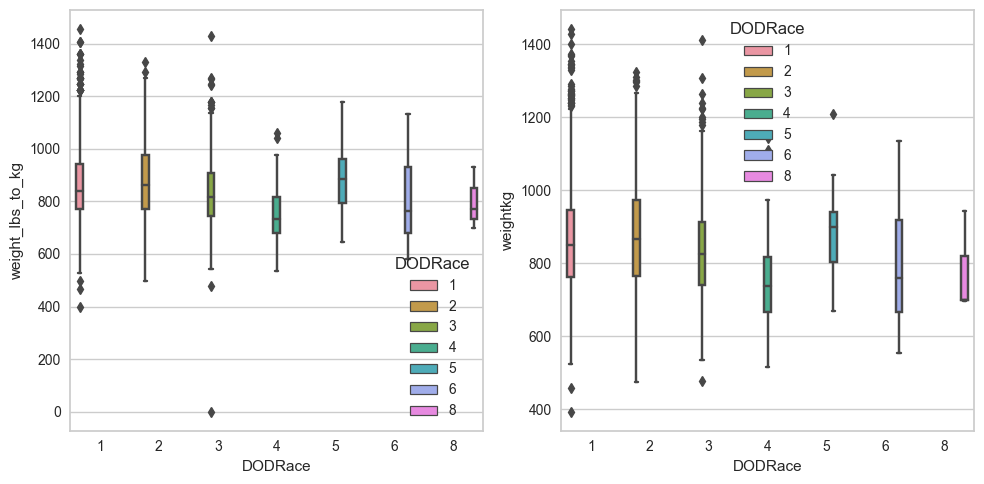

In [22]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
sns.boxplot(data=df1, x='DODRace', y='weight_lbs_to_kg', hue='DODRace', ax=axes[0])
axes[0].set_xlabel('DODRace')
sns.boxplot(data=df1, x='DODRace', y='weightkg', hue='DODRace', ax=axes[1])
axes[0].set_xlabel('DODRace')
plt.tight_layout()

##### Drop self reported columns

In [23]:
df1.drop(['Heightin','Weightlbs','Age','heightmm',
          'weight_lbs_to_kg','subjectid','Ethnicity',
          'Date','WritingPreference','SubjectsBirthLocation','SubjectNumericRace',
          'PrimaryMOS','Installation','Component','Branch',],axis=1 ,inplace = True)

In [24]:
numeric_cols = df1.select_dtypes(include='number').columns
numeric_cols

Index(['abdominalextensiondepthsitting', 'acromialheight',
       'acromionradialelength', 'anklecircumference', 'axillaheight',
       'balloffootcircumference', 'balloffootlength', 'biacromialbreadth',
       'bicepscircumferenceflexed', 'bicristalbreadth', 'bideltoidbreadth',
       'bimalleolarbreadth', 'bitragionchinarc', 'bitragionsubmandibulararc',
       'bizygomaticbreadth', 'buttockcircumference', 'buttockdepth',
       'buttockheight', 'buttockkneelength', 'buttockpopliteallength',
       'calfcircumference', 'cervicaleheight', 'chestbreadth',
       'chestcircumference', 'chestdepth', 'chestheight', 'crotchheight',
       'crotchlengthomphalion', 'crotchlengthposterioromphalion', 'earbreadth',
       'earlength', 'earprotrusion', 'elbowrestheight', 'eyeheightsitting',
       'footbreadthhorizontal', 'footlength', 'forearmcenterofgriplength',
       'forearmcircumferenceflexed', 'forearmforearmbreadth',
       'forearmhandlength', 'functionalleglength', 'handbreadth',
      

In [25]:
plot_cols = ['abdominalextensiondepthsitting', 'acromialheight',
       'acromionradialelength', 'anklecircumference', 'axillaheight',
       'balloffootcircumference', 'balloffootlength', 'biacromialbreadth',
       'bicepscircumferenceflexed', 'bicristalbreadth', 'bideltoidbreadth',
       'bimalleolarbreadth', 'bitragionchinarc', 'bitragionsubmandibulararc',
       'bizygomaticbreadth', 'buttockcircumference', 'buttockdepth',
       'buttockheight', 'buttockkneelength', 'buttockpopliteallength',
       'calfcircumference', 'cervicaleheight', 'chestbreadth',
       'chestcircumference', 'chestdepth', 'chestheight', 'crotchheight',
       'crotchlengthomphalion', 'crotchlengthposterioromphalion', 'earbreadth',
       'earlength', 'earprotrusion', 'elbowrestheight', 'eyeheightsitting',
       'footbreadthhorizontal', 'footlength', 'forearmcenterofgriplength',
       'forearmcircumferenceflexed', 'forearmforearmbreadth',
       'forearmhandlength', 'functionalleglength', 'handbreadth',
       'handcircumference', 'handlength', 'headbreadth', 'headcircumference',
       'headlength', 'heelanklecircumference', 'heelbreadth', 'hipbreadth',
       'hipbreadthsitting', 'iliocristaleheight', 'interpupillarybreadth',
       'interscyei', 'interscyeii', 'kneeheightmidpatella',
       'kneeheightsitting', 'lateralfemoralepicondyleheight',
       'lateralmalleolusheight', 'lowerthighcircumference',
       'mentonsellionlength', 'neckcircumference', 'neckcircumferencebase',
       'overheadfingertipreachsitting', 'palmlength', 'poplitealheight',
       'radialestylionlength', 'shouldercircumference', 'shoulderelbowlength',
       'shoulderlength', 'sittingheight', 'sleevelengthspinewrist',
       'sleeveoutseam', 'span', 'stature', 'suprasternaleheight',
       'tenthribheight', 'thighcircumference', 'thighclearance',
       'thumbtipreach', 'tibialheight', 'tragiontopofhead',
       'trochanterionheight', 'verticaltrunkcircumferenceusa',
       'waistbacklength', 'waistbreadth', 'waistcircumference', 'waistdepth',
       'waistfrontlengthsitting', 'waistheightomphalion', 'weightkg',
       'wristcircumference', 'wristheight']

In [26]:
num_cols = df1.select_dtypes(include='number').shape[1]
num_cols

94

##### KDEPLOT 

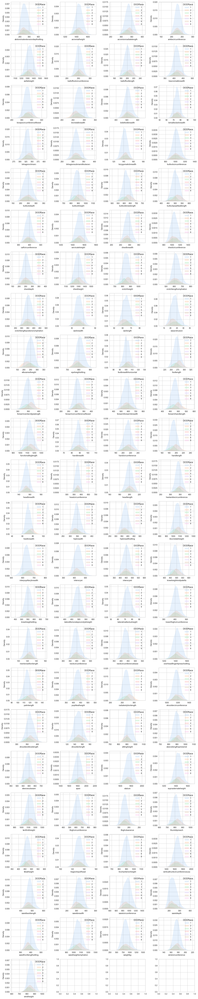

In [27]:
num_cols = 4
num_rows = len(plot_cols) // num_cols + 1

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 75))
for i in range(len(plot_cols)):
    row = i // num_cols
    col = plot_cols[i]
    ax = axes[row][i % num_cols]
    sns.kdeplot(data=df1, hue=df1.DODRace,fill= True,palette='pastel', x=col, ax=ax)
    ax.set_xlabel(col)
    plt.tight_layout()

#####  BOX PLOT

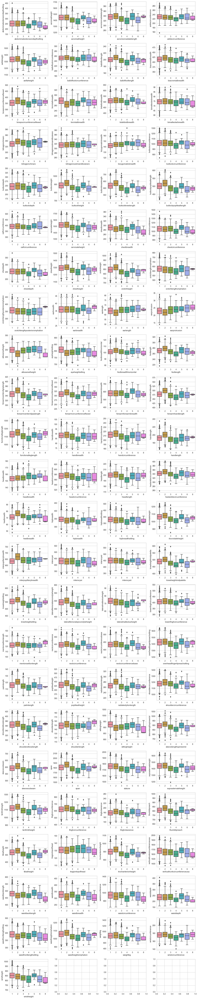

In [28]:
num_cols = 4
num_rows = len(plot_cols) // num_cols + 1

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 75))
for i in range(len(plot_cols)):
    row = i // num_cols
    col = plot_cols[i]
    ax = axes[row][i % num_cols]
    sns.boxplot(data=df1, x=df1.DODRace, y=col, ax=ax,whis=1.5)
    ax.set_xlabel(col)
    plt.tight_layout()

##### Checking for the outliers 

In [29]:
class_1 = [1,2,3,4,5,6,8]  # Classes of DODRace
total_outliers = 0

for k in class_1:
    for i in plot_cols:          
        data = df1[df1['DODRace'] == k][i]
        q1, q3 = np.percentile(data, [25, 75])
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr                  # IQR *2.5 %2.4 veri kaybi 
        upper_bound = q3 + 1.5 * iqr
        outliers = data[(data < lower_bound) | (data > upper_bound)]
        outlier_percentage = 100 * len(outliers) / len(data)
        total_outliers += len(outliers)
        if outlier_percentage > 5 :
            print(f'Class {k :<10} {i :<32}:  {outlier_percentage:.2f}%')

total_outlier_percentage = 100 * total_outliers / len(df1)
print(f'Total outlier : {total_outliers}')
print(f'Total outlier percentage: {total_outlier_percentage:.2f}%')

Class 5          acromialheight                  :  6.90%
Class 5          earbreadth                      :  6.90%
Class 5          earprotrusion                   :  6.90%
Class 5          interscyeii                     :  6.90%
Class 5          kneeheightmidpatella            :  6.90%
Class 5          mentonsellionlength             :  6.90%
Class 6          biacromialbreadth               :  8.82%
Class 6          heelbreadth                     :  8.82%
Class 6          lateralmalleolusheight          :  17.65%
Total outlier : 3567
Total outlier percentage: 87.38%


##### Dropping Outliers 2.5*IQR 

In [30]:
# class_1 = [1, 2, 3, 4, 5, 6, 8]
# total_outliers = 0

# for k in class_1:
#     for i in plot_cols:
#         data = df1[df1['DODRace'] == k][i]
#         q1, q3 = np.percentile(data, [25, 75])
#         iqr = q3 - q1
#         lower_bound = q1 - 2.5 * iqr
#         upper_bound = q3 + 2.5 * iqr
#         outliers = data[(data < lower_bound) | (data > upper_bound)]
#         total_outliers += len(outliers)
#         df1 = df1.drop(outliers.index, axis=0)

# total_outlier_percentage = 100 * total_outliers / len(df1)
# print(f'Total outlier : {total_outliers}')
# print(f'Total outlier percentage: {total_outlier_percentage:.2f}%')

In [31]:
df1.shape

(4082, 95)

##### Correlation DODRace 

In [32]:
corr_df1 = pd.DataFrame(df1.drop('Gender',axis=1).corr()[-1:-2:-1].T)
corr_df1

,DODRace
abdominalextensiondepthsitting,-0.063824
acromialheight,-0.213951
acromionradialelength,-0.165022
anklecircumference,-0.093575
axillaheight,-0.200264
balloffootcircumference,-0.042324
balloffootlength,-0.056465
biacromialbreadth,-0.050360
bicepscircumferenceflexed,0.031856
bicristalbreadth,-0.166699


In [33]:
corr_df1.drop(['DODRace'], axis=0,inplace=True)

In [34]:
corr_df1.sort_values(by='DODRace' ,ascending=True, inplace=True)

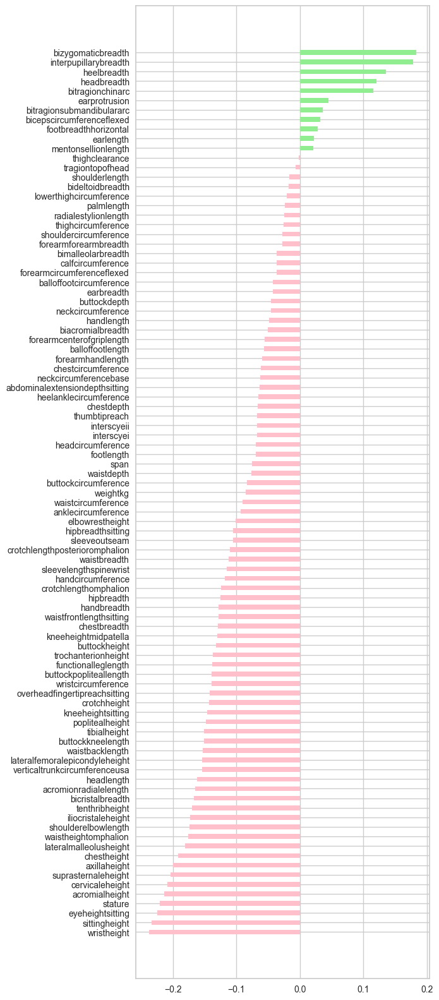

In [35]:
color1 = [('lightgreen' if p > 0 else 'pink') for p in corr_df1.values]
plt.figure(figsize=(6,20))

ax = plt.barh(corr_df1.index, corr_df1.DODRace,
              height=0.5, 
              align='center',
              color=color1)

#### Implementing same steps for female data set

In [36]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1986 entries, 0 to 1985
Columns: 108 entries, SubjectId to WritingPreference
dtypes: int64(99), object(9)
memory usage: 1.6+ MB


In [37]:
df2.describe().T

,count,mean,std,min,25%,50%,75%,max
SubjectId,1986.0,22306.606244,20904.730297,10037.0,17667.00,22096.5,26089.75,920103.0
abdominalextensiondepthsitting,1986.0,229.651057,31.464691,155.0,207.00,227.0,249.00,358.0
acromialheight,1986.0,1335.095166,58.079885,1115.0,1298.00,1332.0,1374.00,1536.0
acromionradialelength,1986.0,311.198389,17.164691,249.0,300.00,311.0,323.00,371.0
anklecircumference,1986.0,215.739678,14.891757,170.0,205.00,215.0,225.00,275.0
axillaheight,1986.0,1239.029708,55.801958,1038.0,1202.00,1236.0,1277.00,1419.0
balloffootcircumference,1986.0,228.110272,11.771007,194.0,220.00,227.0,236.00,270.0
balloffootlength,1986.0,182.051360,9.641920,151.0,175.00,182.0,188.00,216.0
biacromialbreadth,1986.0,365.348943,18.298851,283.0,353.00,365.0,378.00,422.0
bicepscircumferenceflexed,1986.0,305.578550,30.757033,216.0,285.00,304.0,324.00,435.0


##### Missing value check

In [38]:
missing_count = df2.isnull().sum()
value_count = df2.isnull().count()
missing_percentage = round(missing_count / value_count * 100, 2)
missing_df = pd.DataFrame({"count": missing_count, "percentage":missing_percentage})

missing_df[missing_df['count'] >0]

,count,percentage
Ethnicity,1467,73.87


In [39]:
df2.duplicated().sum()

0

In [40]:
df2.DODRace.value_counts()

DODRace
1    975
2    656
3    239
4     71
6     25
5     20
Name: count, dtype: int64

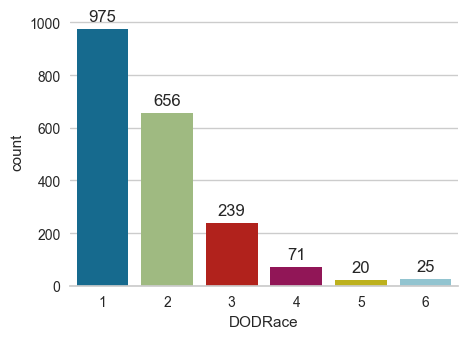

In [41]:
ax = sns.countplot(x='DODRace', data=df2)

# Remove the frame
sns.despine(ax=ax, left=True)

# Add the numbers on top of the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')

# Show the plot
plt.show()

In [42]:
df2.SubjectsBirthLocation.nunique()

119

In [43]:
df2.groupby('DODRace').SubjectsBirthLocation.value_counts()

DODRace  SubjectsBirthLocation   
1        Minnesota                   69
         California                  62
         New York                    56
         Michigan                    52
         Texas                       46
         Wisconsin                   45
         Illinois                    43
         Pennsylvania                40
         Indiana                     38
         Ohio                        34
         Florida                     33
         Mississippi                 29
         Oklahoma                    25
         Alabama                     22
         Germany                     20
         Georgia                     19
         Colorado                    19
         Virginia                    18
         Arizona                     16
         Washington                  16
         Missouri                    14
         South Dakota                14
         Tennessee                   14
         South Carolina              13
      

In [44]:
df2.groupby('SubjectsBirthLocation').Ethnicity.value_counts()

SubjectsBirthLocation     Ethnicity                                         
Alabama                   Chinese Puerto Rican Seminole                          1
                          Creek                                                  1
Alaska                    Eskimo                                                 1
American Samoa            Samoan                                                 3
                          Polynesian Samoan                                      2
Antigua and Barbuda       Caribbean Islander                                     2
Argentina                 Argentine                                              1
Arizona                   Mexican                                                5
                          Navajo                                                 3
                          Apache Cherokee                                        1
                          Creek Samoan                                           1
          

In [45]:
df2.groupby('DODRace').SubjectNumericRace.value_counts()

DODRace  SubjectNumericRace
1        1                     911
         51                     29
         31                     11
         61                      5
         41                      5
         18                      4
         8                       3
         351                     2
         3                       2
         651                     1
         2351                    1
         21                      1
2        2                     523
         8                      46
         21                     28
         28                     10
         23                     10
         251                     8
         25                      6
         42                      4
         62                      4
         231                     3
         218                     3
         235                     2
         1                       2
         18                      1
         3                       1
         423               

In [46]:
df2.groupby(['DODRace','SubjectNumericRace']).Ethnicity.value_counts()

DODRace  SubjectNumericRace  Ethnicity                                         
1        3                   Mexican                                                1
                             Puerto Rican                                           1
         8                   Arab or Middle Eastern                                 3
         18                  Arab or Middle Eastern                                 3
                             East/Asian Indian                                      1
         31                  Mexican                                               10
                             Puerto Rican                                           1
         41                  Japanese                                               2
                             Thai                                                   1
                             Korean                                                 1
                             Chinese Vietnamese             

In [47]:
df2['heightmm'] = df2.Heightin*25.4

In [48]:
df2.stature.max(),df2.heightmm.max()

(1829, 2032.0)

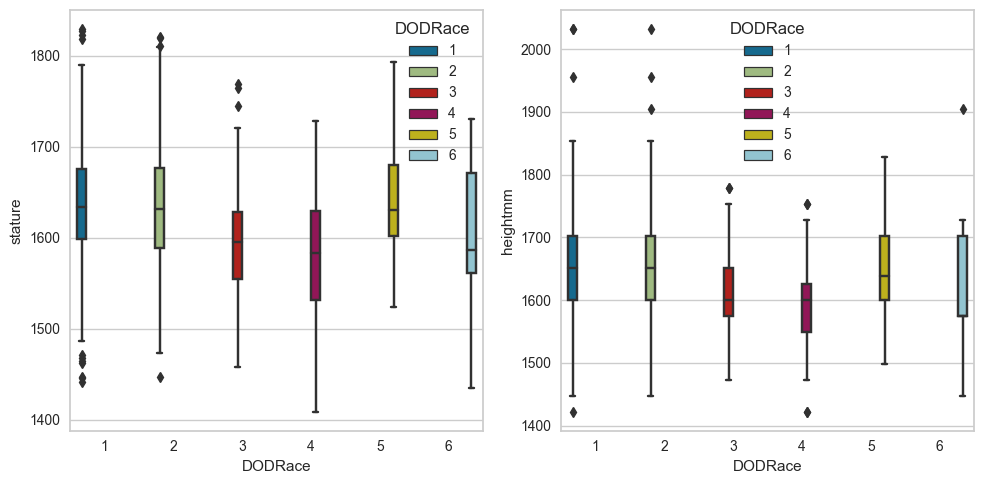

In [49]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
sns.boxplot(data=df2, x='DODRace', y='stature', hue='DODRace', ax=axes[0])
axes[0].set_xlabel('DODRace')
sns.boxplot(data=df2, x='DODRace', y='heightmm', hue='DODRace', ax=axes[1])
axes[0].set_xlabel('DODRace')
plt.tight_layout()

##### Drop unnecessary columns

In [50]:
df2.drop(['Heightin','Weightlbs','Age','heightmm',
          'SubjectId','Ethnicity',
          'Date','WritingPreference','SubjectsBirthLocation','SubjectNumericRace',
          'PrimaryMOS','Installation','Component','Branch',],axis=1 ,inplace = True)

In [51]:
numeric_cols = df2.select_dtypes(include='number').columns
numeric_cols

Index(['abdominalextensiondepthsitting', 'acromialheight',
       'acromionradialelength', 'anklecircumference', 'axillaheight',
       'balloffootcircumference', 'balloffootlength', 'biacromialbreadth',
       'bicepscircumferenceflexed', 'bicristalbreadth', 'bideltoidbreadth',
       'bimalleolarbreadth', 'bitragionchinarc', 'bitragionsubmandibulararc',
       'bizygomaticbreadth', 'buttockcircumference', 'buttockdepth',
       'buttockheight', 'buttockkneelength', 'buttockpopliteallength',
       'calfcircumference', 'cervicaleheight', 'chestbreadth',
       'chestcircumference', 'chestdepth', 'chestheight', 'crotchheight',
       'crotchlengthomphalion', 'crotchlengthposterioromphalion', 'earbreadth',
       'earlength', 'earprotrusion', 'elbowrestheight', 'eyeheightsitting',
       'footbreadthhorizontal', 'footlength', 'forearmcenterofgriplength',
       'forearmcircumferenceflexed', 'forearmforearmbreadth',
       'forearmhandlength', 'functionalleglength', 'handbreadth',
      

In [52]:
plot_cols = ['abdominalextensiondepthsitting', 'acromialheight',
       'acromionradialelength', 'anklecircumference', 'axillaheight',
       'balloffootcircumference', 'balloffootlength', 'biacromialbreadth',
       'bicepscircumferenceflexed', 'bicristalbreadth', 'bideltoidbreadth',
       'bimalleolarbreadth', 'bitragionchinarc', 'bitragionsubmandibulararc',
       'bizygomaticbreadth', 'buttockcircumference', 'buttockdepth',
       'buttockheight', 'buttockkneelength', 'buttockpopliteallength',
       'calfcircumference', 'cervicaleheight', 'chestbreadth',
       'chestcircumference', 'chestdepth', 'chestheight', 'crotchheight',
       'crotchlengthomphalion', 'crotchlengthposterioromphalion', 'earbreadth',
       'earlength', 'earprotrusion', 'elbowrestheight', 'eyeheightsitting',
       'footbreadthhorizontal', 'footlength', 'forearmcenterofgriplength',
       'forearmcircumferenceflexed', 'forearmforearmbreadth',
       'forearmhandlength', 'functionalleglength', 'handbreadth',
       'handcircumference', 'handlength', 'headbreadth', 'headcircumference',
       'headlength', 'heelanklecircumference', 'heelbreadth', 'hipbreadth',
       'hipbreadthsitting', 'iliocristaleheight', 'interpupillarybreadth',
       'interscyei', 'interscyeii', 'kneeheightmidpatella',
       'kneeheightsitting', 'lateralfemoralepicondyleheight',
       'lateralmalleolusheight', 'lowerthighcircumference',
       'mentonsellionlength', 'neckcircumference', 'neckcircumferencebase',
       'overheadfingertipreachsitting', 'palmlength', 'poplitealheight',
       'radialestylionlength', 'shouldercircumference', 'shoulderelbowlength',
       'shoulderlength', 'sittingheight', 'sleevelengthspinewrist',
       'sleeveoutseam', 'span', 'stature', 'suprasternaleheight',
       'tenthribheight', 'thighcircumference', 'thighclearance',
       'thumbtipreach', 'tibialheight', 'tragiontopofhead',
       'trochanterionheight', 'verticaltrunkcircumferenceusa',
       'waistbacklength', 'waistbreadth', 'waistcircumference', 'waistdepth',
       'waistfrontlengthsitting', 'waistheightomphalion', 'weightkg',
       'wristcircumference', 'wristheight']

In [53]:
num_cols = df2.select_dtypes(include='number').shape[1]
num_cols

94

##### KDEPLOT

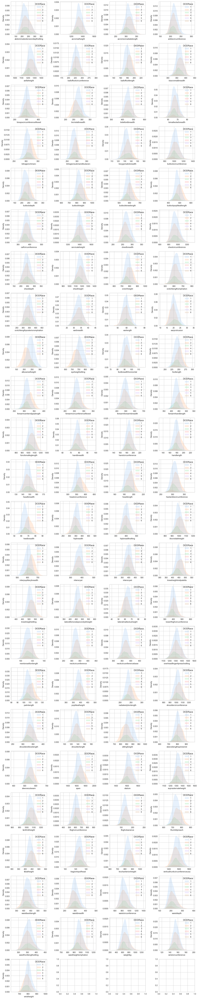

In [54]:
num_cols = 4
num_rows = len(plot_cols) // num_cols + 1

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 75))
for i in range(len(plot_cols)):
    row = i // num_cols
    col = plot_cols[i]
    ax = axes[row][i % num_cols]
    sns.kdeplot(data=df2, hue=df2.DODRace,fill= True,palette='pastel', x=col, ax=ax)
    ax.set_xlabel(col)
    plt.tight_layout()

##### BOX PLOT

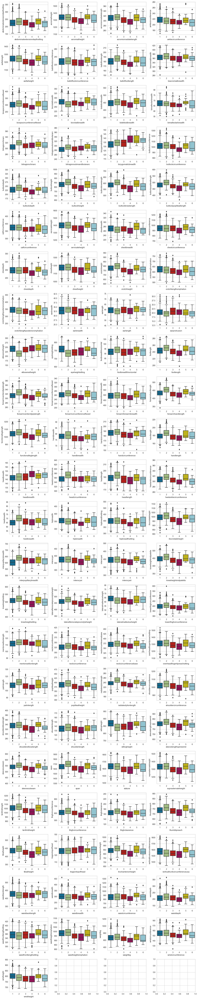

In [55]:
num_cols = 4
num_rows = len(plot_cols) // num_cols + 1

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 75))
for i in range(len(plot_cols)):
    row = i // num_cols
    col = plot_cols[i]
    ax = axes[row][i % num_cols]
    sns.boxplot(data=df2, x=df2.DODRace, y=col, ax=ax,whis=1.5)
    ax.set_xlabel(col)
    plt.tight_layout()

In [74]:
df2.DODRace.value_counts()

DODRace
1    975
2    656
3    239
4     71
6     25
5     20
Name: count, dtype: int64

##### Checking for the outliers

In [75]:
class_1 = [1,2,3,4,5,6]  # Classes of DODRace
total_outliers = 0

for k in class_1:
    for i in plot_cols:          
        data = df2[df2['DODRace'] == k][i]
        q1, q3 = np.percentile(data, [25, 75])
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr                  # IQR *2.5 %2.4 veri kaybi 
        upper_bound = q3 + 1.5 * iqr
        outliers = data[(data < lower_bound) | (data > upper_bound)]
        outlier_percentage = 100 * len(outliers) / len(data)
        total_outliers += len(outliers)
        if outlier_percentage > 5 :
            print(f'Class {k :<10} {i :<32}:  {outlier_percentage:.2f}%')

total_outlier_percentage = 100 * total_outliers / len(df2)
print(f'Total outlier : {total_outliers}')
print(f'Total outlier percentage: {total_outlier_percentage:.2f}%')

Class 4          waistfrontlengthsitting         :  8.45%
Class 5          anklecircumference              :  10.00%
Class 5          bimalleolarbreadth              :  25.00%
Class 5          buttockdepth                    :  10.00%
Class 5          chestdepth                      :  10.00%
Class 5          earbreadth                      :  10.00%
Class 5          handbreadth                     :  10.00%
Class 5          handcircumference               :  10.00%
Class 5          interscyeii                     :  15.00%
Class 5          lowerthighcircumference         :  15.00%
Class 5          sittingheight                   :  10.00%
Class 5          tragiontopofhead                :  10.00%
Class 5          waistbacklength                 :  10.00%
Class 5          waistcircumference              :  10.00%
Class 5          wristheight                     :  10.00%
Class 6          balloffootcircumference         :  8.00%
Class 6          biacromialbreadth               :  8.00%


##### Drop outliers

In [76]:
# class_1 = [1, 2, 3, 4, 5, 6]
# total_outliers = 0

# for k in class_1:
#     for i in plot_cols:
#         data = df2[df2['DODRace'] == k][i]
#         q1, q3 = np.percentile(data, [25, 75])
#         iqr = q3 - q1
#         lower_bound = q1 - 2.5 * iqr
#         upper_bound = q3 + 2.5 * iqr
#         outliers = data[(data < lower_bound) | (data > upper_bound)]
#         total_outliers += len(outliers)
#         df2 = df2.drop(outliers.index, axis=0)

# total_outlier_percentage = 100 * total_outliers / len(df2)
# print(f'Total outlier : {total_outliers}')
# print(f'Total outlier percentage: {total_outlier_percentage:.2f}%')

##### Correlation DODRace

In [77]:
corr_df2 = pd.DataFrame(df2.drop('Gender',axis =1).corr()[-1:-2:-1].T)

In [78]:
corr_df2.drop(['DODRace'], axis=0,inplace=True)

In [79]:
corr_df2.sort_values(by='DODRace' ,ascending=True, inplace=True)

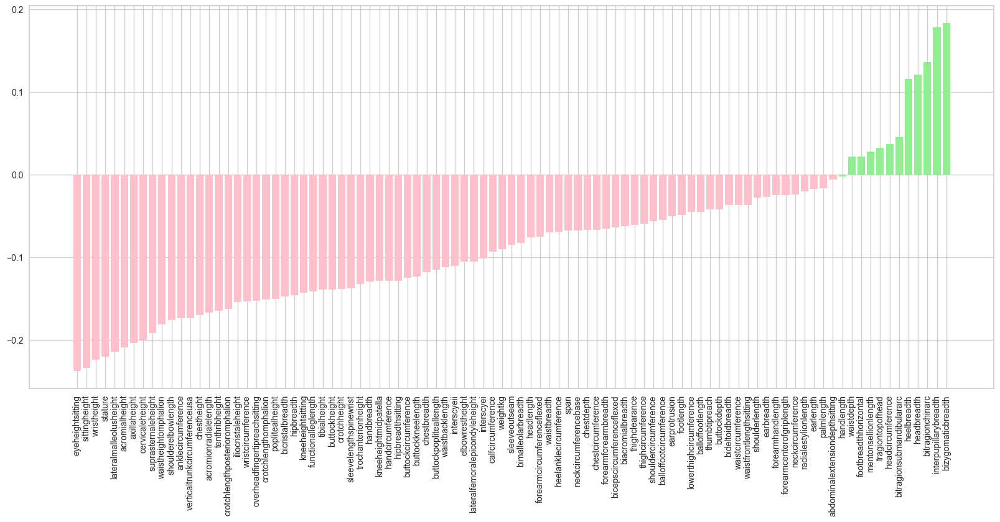

In [80]:
color1 = [('lightgreen' if p > 0 else 'pink') for p in corr_df2.values]
plt.figure(figsize=(20,8))
plt.xticks(rotation= 90)
ax = plt.bar(corr_df2.index, corr_df1.DODRace,
             
              align='center',
              color=color1)

#### Concat male femal data sets 

In [81]:
df = pd.concat([df1,df2])

In [82]:
df.head()

,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,bicristalbreadth,bideltoidbreadth,bimalleolarbreadth,bitragionchinarc,bitragionsubmandibulararc,bizygomaticbreadth,buttockcircumference,buttockdepth,buttockheight,buttockkneelength,buttockpopliteallength,calfcircumference,cervicaleheight,chestbreadth,chestcircumference,chestdepth,chestheight,crotchheight,crotchlengthomphalion,crotchlengthposterioromphalion,earbreadth,earlength,earprotrusion,elbowrestheight,eyeheightsitting,footbreadthhorizontal,footlength,forearmcenterofgriplength,forearmcircumferenceflexed,forearmforearmbreadth,forearmhandlength,functionalleglength,handbreadth,handcircumference,handlength,headbreadth,headcircumference,headlength,heelanklecircumference,heelbreadth,hipbreadth,hipbreadthsitting,iliocristaleheight,interpupillarybreadth,interscyei,interscyeii,kneeheightmidpatella,kneeheightsitting,lateralfemoralepicondyleheight,lateralmalleolusheight,lowerthighcircumference,mentonsellionlength,neckcircumference,neckcircumferencebase,overheadfingertipreachsitting,palmlength,poplitealheight,radialestylionlength,shouldercircumference,shoulderelbowlength,shoulderlength,sittingheight,sleevelengthspinewrist,sleeveoutseam,span,stature,suprasternaleheight,tenthribheight,thighcircumference,thighclearance,thumbtipreach,tibialheight,tragiontopofhead,trochanterionheight,verticaltrunkcircumferenceusa,waistbacklength,waistbreadth,waistcircumference,waistdepth,waistfrontlengthsitting,waistheightomphalion,weightkg,wristcircumference,wristheight,Gender,DODRace
0,266,1467,337,222,1347,253,202,401,369,274,493,71,319,291,142,979,240,882,619,509,373,1535,291,1074,259,1292,877,607,351,36,71,19,247,802,101,273,349,299,575,477,1136,90,214,193,150,583,206,326,70,332,366,1071,685,422,441,502,560,500,77,391,118,400,436,1447,113,437,273,1151,368,145,928,883,600,1782,1776,1449,1092,610,164,786,491,140,919,1700,501,329,933,240,440,1054,815,175,853,Male,1
1,233,1395,326,220,1293,245,193,394,338,257,479,67,344,320,135,944,232,870,584,468,357,1471,269,1021,253,1244,851,615,376,33,62,18,232,781,98,263,348,289,523,476,1096,86,203,195,146,568,201,334,72,312,356,1046,620,441,447,490,540,488,73,371,131,380,420,1380,118,417,254,1119,353,141,884,868,564,1745,1702,1387,1076,572,169,822,476,120,918,1627,432,316,870,225,371,1054,726,167,815,Male,1
2,287,1430,341,230,1327,256,196,427,408,261,544,75,345,330,135,1054,258,901,623,506,412,1501,288,1120,267,1288,854,636,359,40,61,23,237,810,103,270,355,357,575,491,1115,93,220,203,148,573,202,356,70,349,393,1053,665,462,475,496,556,482,72,409,123,403,434,1447,121,431,268,1276,367,167,917,910,604,1867,1735,1438,1105,685,198,807,477,125,918,1678,472,329,964,255,411,1041,929,180,831,Male,2
3,234,1347,310,230,1239,262,199,401,359,262,518,73,328,309,143,991,242,821,560,437,395,1423,296,1114,262,1205,769,590,341,39,66,25,272,794,106,267,352,318,593,467,1034,91,217,194,158,576,199,341,68,338,367,986,640,458,461,460,511,452,76,393,106,407,446,1357,118,393,249,1155,330,148,903,848,550,1708,1655,1346,1021,604,180,803,445,127,847,1625,461,315,857,205,399,968,794,176,793,Male,1
4,250,1585,372,247,1478,267,224,435,356,263,524,80,340,310,138,1029,275,1080,706,567,425,1684,304,1048,232,1452,1014,682,382,32,56,19,188,814,111,305,399,324,605,550,1279,94,222,218,153,566,197,374,69,332,372,1251,675,481,505,612,666,585,85,458,135,398,430,1572,132,523,302,1231,400,180,919,995,641,2035,1914,1596,1292,672,194,962,584,122,1090,1679,467,303,868,214,379,1245,946,188,954,Male,2


In [83]:
# other_countries = df['SubjectsBirthLocation'].value_counts()[df['SubjectsBirthLocation'].value_counts() < 50].index.tolist()
# df.loc[df['SubjectsBirthLocation'].isin(other_countries), 'SubjectsBirthLocation'] = 'Other'

In [84]:
df.shape

(6068, 95)

In [85]:
df.DODRace.value_counts()

DODRace
1    3792
2    1298
3     679
4     188
6      59
5      49
8       3
Name: count, dtype: int64

In [86]:
df = df[df['DODRace'].isin([1, 2, 3])]

In [87]:
df.DODRace.value_counts()

DODRace
1    3792
2    1298
3     679
Name: count, dtype: int64

In [88]:
df.shape

(5769, 95)

In [89]:
label_encoder = LabelEncoder()

In [90]:
df.DODRace = label_encoder.fit_transform(df.DODRace)

In [91]:
df.Gender = label_encoder.fit_transform(df.Gender)

In [92]:
df.head()

,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,bicristalbreadth,bideltoidbreadth,bimalleolarbreadth,bitragionchinarc,bitragionsubmandibulararc,bizygomaticbreadth,buttockcircumference,buttockdepth,buttockheight,buttockkneelength,buttockpopliteallength,calfcircumference,cervicaleheight,chestbreadth,chestcircumference,chestdepth,chestheight,crotchheight,crotchlengthomphalion,crotchlengthposterioromphalion,earbreadth,earlength,earprotrusion,elbowrestheight,eyeheightsitting,footbreadthhorizontal,footlength,forearmcenterofgriplength,forearmcircumferenceflexed,forearmforearmbreadth,forearmhandlength,functionalleglength,handbreadth,handcircumference,handlength,headbreadth,headcircumference,headlength,heelanklecircumference,heelbreadth,hipbreadth,hipbreadthsitting,iliocristaleheight,interpupillarybreadth,interscyei,interscyeii,kneeheightmidpatella,kneeheightsitting,lateralfemoralepicondyleheight,lateralmalleolusheight,lowerthighcircumference,mentonsellionlength,neckcircumference,neckcircumferencebase,overheadfingertipreachsitting,palmlength,poplitealheight,radialestylionlength,shouldercircumference,shoulderelbowlength,shoulderlength,sittingheight,sleevelengthspinewrist,sleeveoutseam,span,stature,suprasternaleheight,tenthribheight,thighcircumference,thighclearance,thumbtipreach,tibialheight,tragiontopofhead,trochanterionheight,verticaltrunkcircumferenceusa,waistbacklength,waistbreadth,waistcircumference,waistdepth,waistfrontlengthsitting,waistheightomphalion,weightkg,wristcircumference,wristheight,Gender,DODRace
0,266,1467,337,222,1347,253,202,401,369,274,493,71,319,291,142,979,240,882,619,509,373,1535,291,1074,259,1292,877,607,351,36,71,19,247,802,101,273,349,299,575,477,1136,90,214,193,150,583,206,326,70,332,366,1071,685,422,441,502,560,500,77,391,118,400,436,1447,113,437,273,1151,368,145,928,883,600,1782,1776,1449,1092,610,164,786,491,140,919,1700,501,329,933,240,440,1054,815,175,853,1,0
1,233,1395,326,220,1293,245,193,394,338,257,479,67,344,320,135,944,232,870,584,468,357,1471,269,1021,253,1244,851,615,376,33,62,18,232,781,98,263,348,289,523,476,1096,86,203,195,146,568,201,334,72,312,356,1046,620,441,447,490,540,488,73,371,131,380,420,1380,118,417,254,1119,353,141,884,868,564,1745,1702,1387,1076,572,169,822,476,120,918,1627,432,316,870,225,371,1054,726,167,815,1,0
2,287,1430,341,230,1327,256,196,427,408,261,544,75,345,330,135,1054,258,901,623,506,412,1501,288,1120,267,1288,854,636,359,40,61,23,237,810,103,270,355,357,575,491,1115,93,220,203,148,573,202,356,70,349,393,1053,665,462,475,496,556,482,72,409,123,403,434,1447,121,431,268,1276,367,167,917,910,604,1867,1735,1438,1105,685,198,807,477,125,918,1678,472,329,964,255,411,1041,929,180,831,1,1
3,234,1347,310,230,1239,262,199,401,359,262,518,73,328,309,143,991,242,821,560,437,395,1423,296,1114,262,1205,769,590,341,39,66,25,272,794,106,267,352,318,593,467,1034,91,217,194,158,576,199,341,68,338,367,986,640,458,461,460,511,452,76,393,106,407,446,1357,118,393,249,1155,330,148,903,848,550,1708,1655,1346,1021,604,180,803,445,127,847,1625,461,315,857,205,399,968,794,176,793,1,0
4,250,1585,372,247,1478,267,224,435,356,263,524,80,340,310,138,1029,275,1080,706,567,425,1684,304,1048,232,1452,1014,682,382,32,56,19,188,814,111,305,399,324,605,550,1279,94,222,218,153,566,197,374,69,332,372,1251,675,481,505,612,666,585,85,458,135,398,430,1572,132,523,302,1231,400,180,919,995,641,2035,1914,1596,1292,672,194,962,584,122,1090,1679,467,303,868,214,379,1245,946,188,954,1,1


# DATA Preprocessing
- In this step we divide our data to X(Features) and y(Target) then ,
- To train and evaluation purposes we create train and test sets,
- Lastly, scale our data if features not in same scale. Why?

In [172]:
X = df.drop(['DODRace'],axis = 1)
y = df['DODRace'] 

In [94]:
X.head()

,abdominalextensiondepthsitting,acromialheight,acromionradialelength,anklecircumference,axillaheight,balloffootcircumference,balloffootlength,biacromialbreadth,bicepscircumferenceflexed,bicristalbreadth,bideltoidbreadth,bimalleolarbreadth,bitragionchinarc,bitragionsubmandibulararc,bizygomaticbreadth,buttockcircumference,buttockdepth,buttockheight,buttockkneelength,buttockpopliteallength,calfcircumference,cervicaleheight,chestbreadth,chestcircumference,chestdepth,chestheight,crotchheight,crotchlengthomphalion,crotchlengthposterioromphalion,earbreadth,earlength,earprotrusion,elbowrestheight,eyeheightsitting,footbreadthhorizontal,footlength,forearmcenterofgriplength,forearmcircumferenceflexed,forearmforearmbreadth,forearmhandlength,functionalleglength,handbreadth,handcircumference,handlength,headbreadth,headcircumference,headlength,heelanklecircumference,heelbreadth,hipbreadth,hipbreadthsitting,iliocristaleheight,interpupillarybreadth,interscyei,interscyeii,kneeheightmidpatella,kneeheightsitting,lateralfemoralepicondyleheight,lateralmalleolusheight,lowerthighcircumference,mentonsellionlength,neckcircumference,neckcircumferencebase,overheadfingertipreachsitting,palmlength,poplitealheight,radialestylionlength,shouldercircumference,shoulderelbowlength,shoulderlength,sittingheight,sleevelengthspinewrist,sleeveoutseam,span,stature,suprasternaleheight,tenthribheight,thighcircumference,thighclearance,thumbtipreach,tibialheight,tragiontopofhead,trochanterionheight,verticaltrunkcircumferenceusa,waistbacklength,waistbreadth,waistcircumference,waistdepth,waistfrontlengthsitting,waistheightomphalion,weightkg,wristcircumference,wristheight,Gender
0,266,1467,337,222,1347,253,202,401,369,274,493,71,319,291,142,979,240,882,619,509,373,1535,291,1074,259,1292,877,607,351,36,71,19,247,802,101,273,349,299,575,477,1136,90,214,193,150,583,206,326,70,332,366,1071,685,422,441,502,560,500,77,391,118,400,436,1447,113,437,273,1151,368,145,928,883,600,1782,1776,1449,1092,610,164,786,491,140,919,1700,501,329,933,240,440,1054,815,175,853,1
1,233,1395,326,220,1293,245,193,394,338,257,479,67,344,320,135,944,232,870,584,468,357,1471,269,1021,253,1244,851,615,376,33,62,18,232,781,98,263,348,289,523,476,1096,86,203,195,146,568,201,334,72,312,356,1046,620,441,447,490,540,488,73,371,131,380,420,1380,118,417,254,1119,353,141,884,868,564,1745,1702,1387,1076,572,169,822,476,120,918,1627,432,316,870,225,371,1054,726,167,815,1
2,287,1430,341,230,1327,256,196,427,408,261,544,75,345,330,135,1054,258,901,623,506,412,1501,288,1120,267,1288,854,636,359,40,61,23,237,810,103,270,355,357,575,491,1115,93,220,203,148,573,202,356,70,349,393,1053,665,462,475,496,556,482,72,409,123,403,434,1447,121,431,268,1276,367,167,917,910,604,1867,1735,1438,1105,685,198,807,477,125,918,1678,472,329,964,255,411,1041,929,180,831,1
3,234,1347,310,230,1239,262,199,401,359,262,518,73,328,309,143,991,242,821,560,437,395,1423,296,1114,262,1205,769,590,341,39,66,25,272,794,106,267,352,318,593,467,1034,91,217,194,158,576,199,341,68,338,367,986,640,458,461,460,511,452,76,393,106,407,446,1357,118,393,249,1155,330,148,903,848,550,1708,1655,1346,1021,604,180,803,445,127,847,1625,461,315,857,205,399,968,794,176,793,1
4,250,1585,372,247,1478,267,224,435,356,263,524,80,340,310,138,1029,275,1080,706,567,425,1684,304,1048,232,1452,1014,682,382,32,56,19,188,814,111,305,399,324,605,550,1279,94,222,218,153,566,197,374,69,332,372,1251,675,481,505,612,666,585,85,458,135,398,430,1572,132,523,302,1231,400,180,919,995,641,2035,1914,1596,1292,672,194,962,584,122,1090,1679,467,303,868,214,379,1245,946,188,954,1


In [95]:
X.columns

Index(['abdominalextensiondepthsitting', 'acromialheight',
       'acromionradialelength', 'anklecircumference', 'axillaheight',
       'balloffootcircumference', 'balloffootlength', 'biacromialbreadth',
       'bicepscircumferenceflexed', 'bicristalbreadth', 'bideltoidbreadth',
       'bimalleolarbreadth', 'bitragionchinarc', 'bitragionsubmandibulararc',
       'bizygomaticbreadth', 'buttockcircumference', 'buttockdepth',
       'buttockheight', 'buttockkneelength', 'buttockpopliteallength',
       'calfcircumference', 'cervicaleheight', 'chestbreadth',
       'chestcircumference', 'chestdepth', 'chestheight', 'crotchheight',
       'crotchlengthomphalion', 'crotchlengthposterioromphalion', 'earbreadth',
       'earlength', 'earprotrusion', 'elbowrestheight', 'eyeheightsitting',
       'footbreadthhorizontal', 'footlength', 'forearmcenterofgriplength',
       'forearmcircumferenceflexed', 'forearmforearmbreadth',
       'forearmhandlength', 'functionalleglength', 'handbreadth',
      

In [173]:
X_train, X_test,y_train, y_test = train_test_split(X,y,test_size=0.2,stratify=y,random_state=101)

In [97]:
# Branch ve Component eklenip model denendi fakat etkisi yok 
# cat_features = ['Component',
#           'Branch','Gender']

In [98]:
# for feature in cat_features:
#         X_train[feature] = label_encoder.fit_transform(X_train[feature])
#         X_test[feature] = label_encoder.transform(X_test[feature])

# Modelling
- Fit the model with train dataset
- Get predict from vanilla model on both train and test sets to examine if there is over/underfitting   
- Apply GridseachCV for both hyperparemeter tuning and sanity test of our model.
- Use hyperparameters that you find from gridsearch and make final prediction and evaluate the result according to chosen metric.

## 1. Logistic model

### Vanilla Logistic Model

Vanilla modelin anlami; default degerler ile model kurulmasidir.

In [99]:
operations = [("scaler", StandardScaler()), ("logistic", LogisticRegression(class_weight='balanced',random_state=101))]
log_model = Pipeline(steps=operations)

In [101]:
log_model.fit(X_train,y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('logistic', LogisticRegression(random_state=101))])

In [102]:
def eval_metric(model, X_train, y_train, X_test, y_test):

    """ to get the metrics for the model """

    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

In [103]:
eval_metric(log_model,X_train,y_train,X_test,y_test)

Test_Set
[[735  11  12]
 [ 21 232   7]
 [ 68  19  49]]
              precision    recall  f1-score   support

           0       0.89      0.97      0.93       758
           1       0.89      0.89      0.89       260
           2       0.72      0.36      0.48       136

    accuracy                           0.88      1154
   macro avg       0.83      0.74      0.77      1154
weighted avg       0.87      0.88      0.87      1154


Train_Set
[[2913   33   88]
 [  62  955   21]
 [ 278   53  212]]
              precision    recall  f1-score   support

           0       0.90      0.96      0.93      3034
           1       0.92      0.92      0.92      1038
           2       0.66      0.39      0.49       543

    accuracy                           0.88      4615
   macro avg       0.82      0.76      0.78      4615
weighted avg       0.87      0.88      0.87      4615



### Logistic Model GridsearchCV

## Lojistic Regression solver "liblenear" for small dataset

__liblenear__ kucuk datasetlerinde iyi sonuclar verir. Dikkat edilmesi gereken husus; liblinear sadece __penalty="l1"__ ile calisir, yoksa hata verir.

In [104]:
log_model.get_params()

{'memory': None,
 'steps': [('scaler', StandardScaler()),
  ('logistic', LogisticRegression(random_state=101))],
 'verbose': False,
 'scaler': StandardScaler(),
 'logistic': LogisticRegression(random_state=101),
 'scaler__copy': True,
 'scaler__with_mean': True,
 'scaler__with_std': True,
 'logistic__C': 1.0,
 'logistic__class_weight': None,
 'logistic__dual': False,
 'logistic__fit_intercept': True,
 'logistic__intercept_scaling': 1,
 'logistic__l1_ratio': None,
 'logistic__max_iter': 100,
 'logistic__multi_class': 'auto',
 'logistic__n_jobs': None,
 'logistic__penalty': 'l2',
 'logistic__random_state': 101,
 'logistic__solver': 'lbfgs',
 'logistic__tol': 0.0001,
 'logistic__verbose': 0,
 'logistic__warm_start': False}

In [200]:
penalty = ['l1','l2']
C = [0.1,1]
solver = ['liblinear','saga','lbfgs']


param_grid = {"logistic__penalty" : penalty,
              "logistic__C" : C,
              "logistic__solver":solver}
cv = StratifiedKFold(n_splits=10)

In [201]:
log_grid = GridSearchCV(estimator=log_model,
                          param_grid=param_grid,
                          cv=cv,
                          n_jobs=-1,
                          return_train_score=True)

In [202]:
log_grid.fit(X_train,y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('logistic',
                                        LogisticRegression(random_state=101))]),
             n_jobs=-1,
             param_grid={'logistic__C': [0.1, 1],
                         'logistic__penalty': ['l1', 'l2'],
                         'logistic__solver': ['liblinear', 'saga', 'lbfgs']},
             return_train_score=True)

In [203]:
log_grid.best_params_        

{'logistic__C': 1, 'logistic__penalty': 'l2', 'logistic__solver': 'liblinear'}

In [204]:
log_grid.best_score_

0.8736710144519255

In [205]:
y_pred = log_grid.predict(X_test)
y_pred_proba = log_grid.predict_proba(X_test)
log_grid_f1 = f1_score(y_test, y_pred,average='weighted')
log_grid_recall = recall_score(y_test, y_pred,average='weighted')
log_grid_precision = precision_score(y_test,y_pred, average='weighted')
log_grid_auc = roc_auc_score(y_test, y_pred_proba, multi_class='ovo')
eval_metric(log_grid,X_train,y_train,X_test,y_test,)

Test_Set
[[738  13   7]
 [ 21 235   4]
 [ 74  20  42]]
              precision    recall  f1-score   support

           0       0.89      0.97      0.93       758
           1       0.88      0.90      0.89       260
           2       0.79      0.31      0.44       136

    accuracy                           0.88      1154
   macro avg       0.85      0.73      0.75      1154
weighted avg       0.87      0.88      0.86      1154


Train_Set
[[2932   35   67]
 [  65  964    9]
 [ 308   61  174]]
              precision    recall  f1-score   support

           0       0.89      0.97      0.93      3034
           1       0.91      0.93      0.92      1038
           2       0.70      0.32      0.44       543

    accuracy                           0.88      4615
   macro avg       0.83      0.74      0.76      4615
weighted avg       0.87      0.88      0.87      4615



## 2. SVC

### Vanilla SVC model 

Vanilla modellerde default degerler verilmeli ama dengesiz bir datasetimiz oldugu icin  class_weight düşünülmeli

In [111]:
operations = [("scaler", StandardScaler()), ("SVC", SVC(probability=True,random_state=101))]
svc_model = Pipeline(steps=operations)

In [112]:
svc_model.fit(X_train,y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('SVC', SVC(probability=True, random_state=101))])

In [113]:
eval_metric(svc_model,X_train,y_train,X_test,y_test)

Test_Set
[[744  11   3]
 [ 25 232   3]
 [100  17  19]]
              precision    recall  f1-score   support

           0       0.86      0.98      0.91       758
           1       0.89      0.89      0.89       260
           2       0.76      0.14      0.24       136

    accuracy                           0.86      1154
   macro avg       0.84      0.67      0.68      1154
weighted avg       0.85      0.86      0.83      1154


Train_Set
[[3010   14   10]
 [  66  968    4]
 [ 365   38  140]]
              precision    recall  f1-score   support

           0       0.87      0.99      0.93      3034
           1       0.95      0.93      0.94      1038
           2       0.91      0.26      0.40       543

    accuracy                           0.89      4615
   macro avg       0.91      0.73      0.76      4615
weighted avg       0.90      0.89      0.87      4615



###  SVC Model GridsearchCV

In [114]:
param_grid = {'SVC__C':[50,100],
              'SVC__kernel':['rbf'],
              'SVC__gamma':["scale"],
              'SVC__degree':[1,2],
              'SVC__class_weight':['balanced', None]}

In [115]:
# Denendi 

# param_grid = {'SVC__C':[0.1,1,10,100],
#               'SVC__kernel':['linear','rbf','sigmoid','poly'],
#               'SVC__gamma':["scale", "auto"],
#               'SVC__degree':[1,2]}


# Best Params
#{'SVC__C': 100, 'SVC__degree': 1, 'SVC__gamma': 'scale', 'SVC__kernel': 'rbf'}

In [116]:
svc_grid = GridSearchCV(svc_model,param_grid)

In [117]:
svc_grid.fit(X_train,y_train)

GridSearchCV(estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('SVC',
                                        SVC(probability=True,
                                            random_state=101))]),
             param_grid={'SVC__C': [50, 100],
                         'SVC__class_weight': ['balanced', None],
                         'SVC__degree': [1, 2], 'SVC__gamma': ['scale'],
                         'SVC__kernel': ['rbf']})

In [118]:
svc_grid.best_params_

{'SVC__C': 50,
 'SVC__class_weight': 'balanced',
 'SVC__degree': 1,
 'SVC__gamma': 'scale',
 'SVC__kernel': 'rbf'}

In [119]:
svc_grid.best_score_

0.8463705308775731

In [120]:
y_pred = svc_grid.predict(X_test)

In [121]:
y_pred.shape

(1154,)

In [122]:
y_pred

array([1, 0, 2, ..., 0, 1, 0], dtype=int64)

In [123]:
y_pred = svc_grid.predict(X_test)
y_pred_proba =svc_grid.predict_proba(X_test)
svc_grid_f1 = f1_score(y_test, y_pred,average='weighted')
svc_grid_recall = recall_score(y_test, y_pred,average='weighted')
svc_grid_auc = roc_auc_score(y_test,y_pred_proba,multi_class='ovo')
svc_grid_precision = precision_score(y_test,y_pred, average='weighted')
eval_metric(svc_grid,X_train,y_train,X_test,y_test)

Test_Set
[[695  17  46]
 [ 22 234   4]
 [ 69  17  50]]
              precision    recall  f1-score   support

           0       0.88      0.92      0.90       758
           1       0.87      0.90      0.89       260
           2       0.50      0.37      0.42       136

    accuracy                           0.85      1154
   macro avg       0.75      0.73      0.74      1154
weighted avg       0.84      0.85      0.84      1154


Train_Set
[[3033    0    1]
 [   0 1038    0]
 [   0    0  543]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3034
           1       1.00      1.00      1.00      1038
           2       1.00      1.00      1.00       543

    accuracy                           1.00      4615
   macro avg       1.00      1.00      1.00      4615
weighted avg       1.00      1.00      1.00      4615



## 3. RF

### Vanilla RF Model

In [124]:
rf_model = RandomForestClassifier(random_state=101)

In [125]:
rf_model.fit(X_train,y_train)

RandomForestClassifier(random_state=101)

In [126]:
eval_metric(rf_model,X_train,y_train,X_test,y_test)

Test_Set
[[740  13   5]
 [ 60 198   2]
 [108  17  11]]
              precision    recall  f1-score   support

           0       0.81      0.98      0.89       758
           1       0.87      0.76      0.81       260
           2       0.61      0.08      0.14       136

    accuracy                           0.82      1154
   macro avg       0.76      0.61      0.61      1154
weighted avg       0.80      0.82      0.78      1154


Train_Set
[[3034    0    0]
 [   0 1038    0]
 [   0    0  543]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3034
           1       1.00      1.00      1.00      1038
           2       1.00      1.00      1.00       543

    accuracy                           1.00      4615
   macro avg       1.00      1.00      1.00      4615
weighted avg       1.00      1.00      1.00      4615



### RF Model GridsearchCV

In [127]:
param_grid = {'n_estimators':[40,60],     #64 ve 128 skorlarina mutlaka bakilmasi gerektigini belirtmistik.
             'max_features':[2,"auto"],
             'max_depth':[3,5,7],
             'min_samples_split':[2,3]}

In [128]:
rf_grid_model = GridSearchCV(rf_model, param_grid)

In [129]:
rf_grid_model.fit(X_train,y_train)

GridSearchCV(estimator=RandomForestClassifier(random_state=101),
             param_grid={'max_depth': [3, 5, 7], 'max_features': [2, 'auto'],
                         'min_samples_split': [2, 3],
                         'n_estimators': [40, 60]})

In [130]:
rf_grid_model.best_params_

{'max_depth': 7,
 'max_features': 'auto',
 'min_samples_split': 3,
 'n_estimators': 40}

In [131]:
rf_grid_model.best_score_

0.7926327193932827

In [132]:
y_pred = rf_grid_model.predict(X_test)
rf_grid_model_f1 = f1_score(y_test, y_pred,average='weighted')
rf_grid_model_recall = recall_score(y_test, y_pred,average='weighted')
rf_grid_model_auc = roc_auc_score(y_test, rf_grid_model.predict_proba(X_test), multi_class='ovo')
rf_grid_model_precison = precision_score(y_test,y_pred, average='weighted')
eval_metric(rf_grid_model,X_train,y_train,X_test,y_test)

Test_Set
[[750   7   1]
 [ 94 166   0]
 [123  13   0]]
              precision    recall  f1-score   support

           0       0.78      0.99      0.87       758
           1       0.89      0.64      0.74       260
           2       0.00      0.00      0.00       136

    accuracy                           0.79      1154
   macro avg       0.56      0.54      0.54      1154
weighted avg       0.71      0.79      0.74      1154


Train_Set
[[3030    4    0]
 [ 220  818    0]
 [ 483   22   38]]
              precision    recall  f1-score   support

           0       0.81      1.00      0.90      3034
           1       0.97      0.79      0.87      1038
           2       1.00      0.07      0.13       543

    accuracy                           0.84      4615
   macro avg       0.93      0.62      0.63      4615
weighted avg       0.87      0.84      0.80      4615



## 4. XGBoost

### Vanilla XGBoost Model

In [133]:
xgb_model = XGBClassifier(random_state=101)

In [134]:
xgb_model.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [135]:
eval_metric(xgb_model,X_train,y_train,X_test,y_test)

Test_Set
[[734  11  13]
 [ 32 221   7]
 [ 92  19  25]]
              precision    recall  f1-score   support

           0       0.86      0.97      0.91       758
           1       0.88      0.85      0.86       260
           2       0.56      0.18      0.28       136

    accuracy                           0.85      1154
   macro avg       0.76      0.67      0.68      1154
weighted avg       0.83      0.85      0.82      1154


Train_Set
[[3034    0    0]
 [   0 1038    0]
 [   0    0  543]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3034
           1       1.00      1.00      1.00      1038
           2       1.00      1.00      1.00       543

    accuracy                           1.00      4615
   macro avg       1.00      1.00      1.00      4615
weighted avg       1.00      1.00      1.00      4615



### XGBoost Model GridsearchCV

In [136]:

# Ilk deneme bu degerlerle yapildi ve best params asagidaki gibi. 
# param_grid = {"n_estimators":[100, 200],'max_depth':[3,4,5], "learning_rate": [0.1, 0.2],
#              "subsample":[0.5, 0.8, 1], "colsample_bytree":[0.5,0.7, 1]}
 
# {'colsample_bytree': 0.5,
#  'learning_rate': 0.1,
#  'max_depth': 3,
#  'n_estimators': 100,
#  'subsample': 0.5}

# ikinci deneme
# {'colsample_bytree': 0.3,
#  'learning_rate': 0.1,
#  'max_depth': 2,
#  'n_estimators': 50,
#  'subsample': 0.3}

In [137]:
# ikinci deneme

param_grid = {"n_estimators":[50, 100],'max_depth':[2,3], "learning_rate": [0.1],
             "subsample":[0.3,0.5], "colsample_bytree":[0.3,0.5]}
 

In [138]:
xgb_grid = GridSearchCV(xgb_model, param_grid, scoring = "recall", verbose=1, n_jobs = -1)

In [139]:
xgb_grid.fit(X_train,y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


GridSearchCV(estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_b...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None,
                                     objective='multi:softprob', predictor=None, ...),
             n_jobs=-1,
             param_grid={'colsample_bytree': [0.3, 0.5], 'learning_rate': [0.1],
                         'max_depth': [2, 3], 'n_estimators': [50, 100],
                         'subsample': [0.3, 0.5]},
             scoring='recall', verbose=1)

In [140]:
xgb_grid.best_params_

{'colsample_bytree': 0.3,
 'learning_rate': 0.1,
 'max_depth': 2,
 'n_estimators': 50,
 'subsample': 0.3}

In [141]:
xgb_grid.best_score_

nan

In [142]:
eval_metric(xgb_grid, X_train, y_train, X_test, y_test)

Test_Set
[[749   7   2]
 [ 85 175   0]
 [111  19   6]]
              precision    recall  f1-score   support

           0       0.79      0.99      0.88       758
           1       0.87      0.67      0.76       260
           2       0.75      0.04      0.08       136

    accuracy                           0.81      1154
   macro avg       0.80      0.57      0.57      1154
weighted avg       0.81      0.81      0.76      1154


Train_Set
[[2995   37    2]
 [ 313  722    3]
 [ 472   47   24]]
              precision    recall  f1-score   support

           0       0.79      0.99      0.88      3034
           1       0.90      0.70      0.78      1038
           2       0.83      0.04      0.08       543

    accuracy                           0.81      4615
   macro avg       0.84      0.58      0.58      4615
weighted avg       0.82      0.81      0.76      4615



In [143]:
y_pred = xgb_grid.predict(X_test)
y_pred_proba = xgb_grid.predict_proba(X_test)
xgb_grid_f1 = f1_score(y_test, y_pred, average='weighted')
xgb_grid_recall = recall_score(y_test, y_pred, average='weighted')
xgb_grid_auc = roc_auc_score(y_test, y_pred_proba, multi_class='ovo')
xgb_grid_precision = precision_score(y_test,y_pred, average='weighted')

## Comparing Models

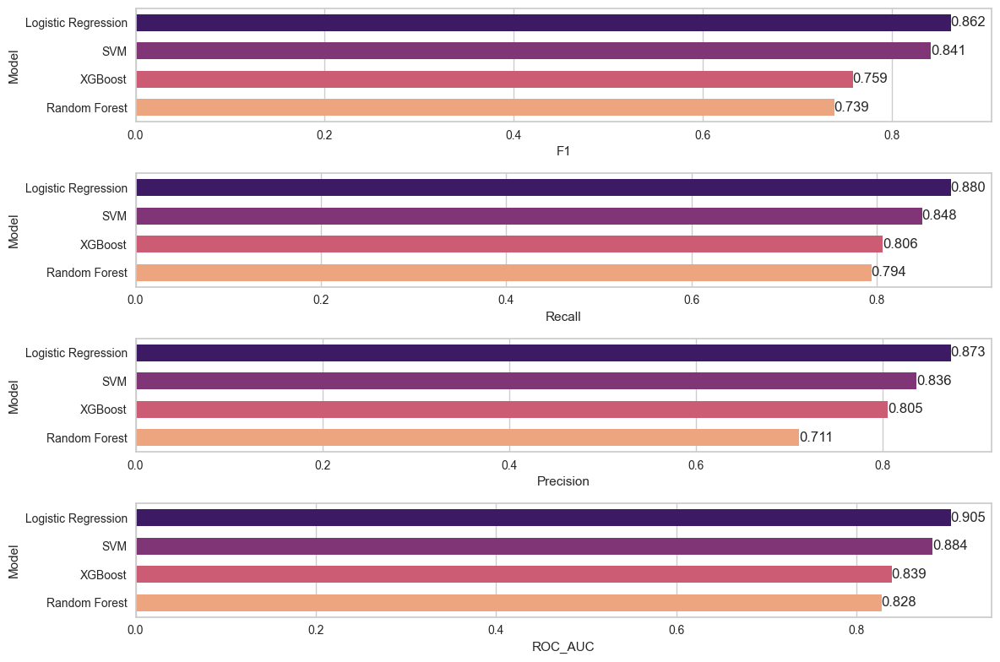

In [144]:
compare = pd.DataFrame({"Model": ["Logistic Regression", "SVM",  "Random Forest",  "XGBoost"],
                        "F1": [log_grid_f1, svc_grid_f1, rf_grid_model_f1, xgb_grid_f1 ],
                        "Recall": [log_grid_recall, svc_grid_recall, rf_grid_model_recall, xgb_grid_recall],
                        "ROC_AUC": [log_grid_auc,svc_grid_auc,rf_grid_model_auc,xgb_grid_auc],
                       "Precision": [log_grid_precision,svc_grid_precision,rf_grid_model_precison,xgb_grid_precision]})





def labels(ax):
    for p in ax.patches:
        width = p.get_width()                        # get bar length
        ax.text(width,                               # set the text at 1 unit right of the bar
                p.get_y() + p.get_height() / 2,      # get Y coordinate + X coordinate / 2
                '{:1.3f}'.format(width),             # set variable to display, 2 decimals
                ha = 'left',                         # horizontal alignment
                va = 'center')                       # vertical alignment
    
plt.figure(figsize=(12,8))
plt.subplot(411)
compare = compare.sort_values(by="F1", ascending=False)
ax=sns.barplot(x="F1", y="Model", data=compare, palette="magma",width=0.6)
labels(ax)

plt.subplot(412)
compare = compare.sort_values(by="Recall", ascending=False)
ax=sns.barplot(x="Recall", y="Model", data=compare, palette="magma",width=0.6)
labels(ax)

plt.subplot(413)
compare = compare.sort_values(by="ROC_AUC", ascending=False)
ax=sns.barplot(x="Precision", y="Model", data=compare, palette="magma",width=0.6)
labels(ax)
plt.subplot(414)
compare = compare.sort_values(by="ROC_AUC", ascending=False)
ax=sns.barplot(x="ROC_AUC", y="Model", data=compare, palette="magma",width=0.6)
labels(ax)
plt.tight_layout()
plt.show()

# Before the Deployment 
- Choose the model that works best based on your chosen metric
- For final step, fit the best model with whole dataset to get better performance.
- And your model ready to deploy, dump your model and scaler.

- Evaluation metrics 
https://towardsdatascience.com/comprehensive-guide-on-multiclass-classification-metrics-af94cfb83fbd

# SMOTE
https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/

##  Smote implement

We got the best scores with Logistic Regression , thats why we choose this as a final model

## Logistic Regression Over/Under Sampling

In [512]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTEENN
from imblearn.under_sampling import EditedNearestNeighbours
from imblearn.under_sampling import ClusterCentroids

from imblearn.pipeline import Pipeline
from sklearn.utils import class_weight

In [513]:
X = df.drop(['DODRace'],axis = 1)
y = df['DODRace'] 

##### Best params of Logistic Regression Grid Search

{'C': 1,
 'class_weight': None,
 'penalty': 'l2',
 'solver': 'liblinear'}

##### Train Test Split

In [514]:
X_train, X_test,y_train, y_test = train_test_split(X,y,test_size=0.2,stratify=y,random_state=101)

#### Final Model

In [515]:
operations = [("scaler", StandardScaler()), ("logistic", LogisticRegression(C= 1, penalty= 'l2', solver= 'liblinear'))]
final_model = Pipeline(steps=operations)

In [516]:
final_model.fit(X_train,y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('logistic', LogisticRegression(C=1, solver='liblinear'))])

In [517]:
eval_metric(final_model,X_train,y_train,X_test,y_test)

Test_Set
[[738  13   7]
 [ 21 235   4]
 [ 74  20  42]]
              precision    recall  f1-score   support

           0       0.89      0.97      0.93       758
           1       0.88      0.90      0.89       260
           2       0.79      0.31      0.44       136

    accuracy                           0.88      1154
   macro avg       0.85      0.73      0.75      1154
weighted avg       0.87      0.88      0.86      1154


Train_Set
[[2932   35   67]
 [  65  964    9]
 [ 308   61  174]]
              precision    recall  f1-score   support

           0       0.89      0.97      0.93      3034
           1       0.91      0.93      0.92      1038
           2       0.70      0.32      0.44       543

    accuracy                           0.88      4615
   macro avg       0.83      0.74      0.76      4615
weighted avg       0.87      0.88      0.87      4615



#### Over/Under sampling model

In [518]:
operations = [("scaler", StandardScaler()), ("logistic", LogisticRegression(C= 1, penalty= 'l2', solver= 'liblinear'))]
final_model_underover = Pipeline(steps=operations)

<Axes: xlabel='DODRace'>

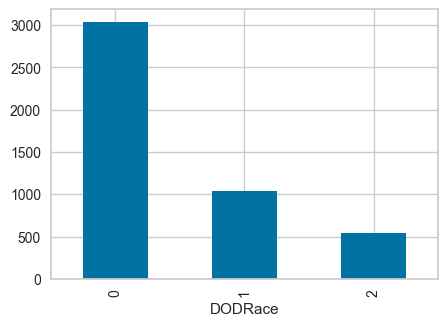

In [519]:
count = y_train.value_counts()
count.plot.bar()

#### Decide the number of samples

In [520]:
n_samples = count.median().astype(np.int64)
n_samples

1038

##### When we choose the mean as the number of samples , our model goes underfitting

In [550]:
n_samples = 2000   # Buradan sample sayisini degistirebiliriz bu rakama gore over ve under sampling ayarlanacak

<Figure size 2000x2000 with 0 Axes>

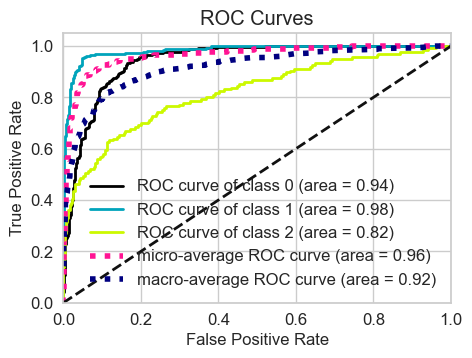

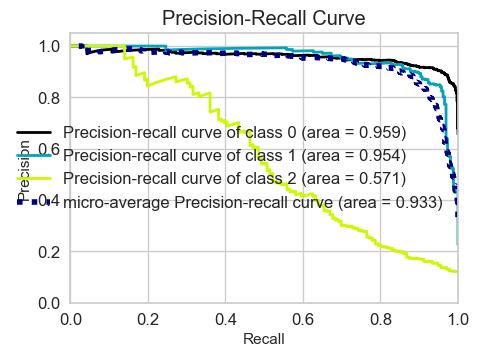

In [551]:
plt.figure(figsize=(20,20))
final_model_underover.fit(X_train, y_train)
y_score = final_model_underover.predict_proba(X_test)
y_pred = final_model_underover.predict(X_test)
# Plot metrics 
plot_roc(y_test, y_score)
plt.show()
    
plot_precision_recall(y_test, y_score)
plt.show()

##### What are our class weights if we use the balanced parameter ?  

In [552]:
classes = np.unique(y_train)
cw = class_weight.compute_class_weight(class_weight='balanced', classes=classes,y= y_train)
weights = dict(zip(classes,cw))

In [553]:
weights

{0: 0.507031421665568, 1: 1.4820166987797045, 2: 2.833026396562308}

In [554]:
def sampling_strategy(X,y,n_samples, t='majority'):
    target_classes = ''
    if t == 'majority':
        target_classes = y.value_counts() > n_samples
    elif t == 'minority':
        target_classes = y.value_counts() < n_samples
    tc = target_classes[target_classes == True].index
    #target_classes_all = y.value_counts().index
    sampling_strategy = {}
    for target in tc:
        sampling_strategy[target] = n_samples
    return sampling_strategy

In [555]:
under_sampler = ClusterCentroids(sampling_strategy=sampling_strategy(X_train,y_train,n_samples,t='majority'))
X_under, y_under = under_sampler.fit_resample(X_train, y_train)

<Axes: xlabel='DODRace'>

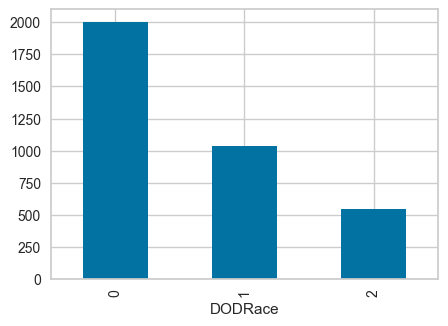

In [556]:
count = y_under.value_counts()
count.plot.bar()

In [557]:
over_sampler = SMOTE(sampling_strategy=sampling_strategy(X_under, y_under,n_samples, t='minority'),k_neighbors=2)
X_bal, y_bal = over_sampler.fit_resample(X_under, y_under)

<Axes: xlabel='DODRace'>

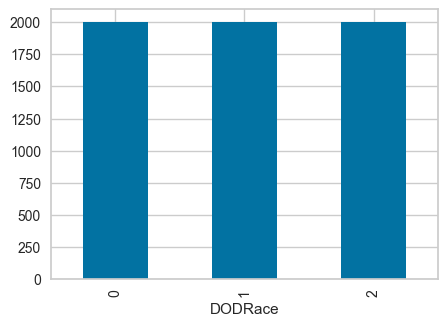

In [558]:
count = y_bal.value_counts()
count.plot.bar()

#### Fit Balanced Data

In [559]:
final_model_underover.fit(X_bal,y_bal)

Pipeline(steps=[('scaler', StandardScaler()),
                ('logistic', LogisticRegression(C=1, solver='liblinear'))])

In [560]:
y_score = final_model_underover.predict_proba(X_test)
y_pred = final_model_underover.predict(X_test)

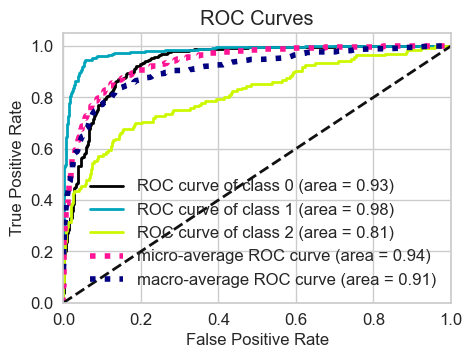

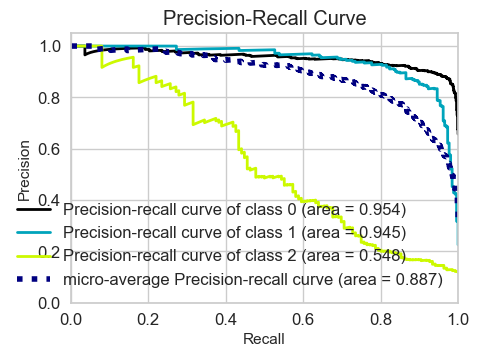

In [561]:
plot_roc(y_test, y_score)
plt.show()
    
plot_precision_recall(y_test, y_score)
plt.show()

In [562]:
eval_metric(final_model_underover,X_bal,y_bal,X_test,y_test)

Test_Set
[[614  18 126]
 [ 13 231  16]
 [ 31  19  86]]
              precision    recall  f1-score   support

           0       0.93      0.81      0.87       758
           1       0.86      0.89      0.88       260
           2       0.38      0.63      0.47       136

    accuracy                           0.81      1154
   macro avg       0.72      0.78      0.74      1154
weighted avg       0.85      0.81      0.82      1154


Train_Set
[[1679   38  283]
 [  43 1878   79]
 [ 380  121 1499]]
              precision    recall  f1-score   support

           0       0.80      0.84      0.82      2000
           1       0.92      0.94      0.93      2000
           2       0.81      0.75      0.78      2000

    accuracy                           0.84      6000
   macro avg       0.84      0.84      0.84      6000
weighted avg       0.84      0.84      0.84      6000



### Conclusion

<br>
<p style="background-color:#476934; color : white;font-size:100%" ;> <br>
The results showed that the ROC and Precision-Recall curve scores did not change significantly after applying these techniques.<br> However, there was a significant improvement in recall score for the model's predictions across class 2.<br>
In conclusion, the combination of logistic regression with grid search and over/undersampling techniques can help to improve the<br> performance of multiclass classification models on imbalanced datasets. The observed improvements in precision and recall scores<br> suggest that this approach can be effective for addressing the challenge of imbalanced data in multiclass classification tasks!<br><br> <p>

#  SHAP

https://towardsdatascience.com/shap-explain-any-machine-learning-model-in-python-24207127cad7

## Shap values for all data

In [563]:
pip install shap

  Using cached shap-0.41.0.tar.gz (380 kB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Using cached tqdm-4.65.0-py3-none-any.whl (77 kB)
  Using cached slicer-0.0.7-py3-none-any.whl (14 kB)
  Using cached numba-0.56.4.tar.gz (2.4 MB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'error'
Note: you may need to restart the kernel to use updated packages.


  error: subprocess-exited-with-error
  
  python setup.py egg_info did not run successfully.
  exit code: 1
  
  [8 lines of output]
  Traceback (most recent call last):
    File "<string>", line 2, in <module>
    File "<pip-setuptools-caller>", line 34, in <module>
    File "C:\Users\Iemand\AppData\Local\Temp\pip-install-sgjqxzm_\numba_26d5882a3ec24eb2a1a6418e887a3dd3\setup.py", line 51, in <module>
      _guard_py_ver()
    File "C:\Users\Iemand\AppData\Local\Temp\pip-install-sgjqxzm_\numba_26d5882a3ec24eb2a1a6418e887a3dd3\setup.py", line 48, in _guard_py_ver
      raise RuntimeError(msg.format(cur_py, min_py, max_py))
  RuntimeError: Cannot install on Python version 3.11.3; only versions >=3.7,<3.11 are supported.
  [end of output]
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
error: metadata-generation-failed

Encountered error while generating package metadata.

See above for output.

note: This is an issue with the package mentioned a

1-Lime: Local Interpretable Model-agnostic Explanations (LIME) is a library for explaining the predictions of machine learning models. It is similar to SHAP in that it provides local explanations that can help users understand how a model arrived at a particular prediction.

2-ELI5: Explain Like I'm 5 (ELI5) is another library for explaining the predictions of machine learning models. It provides several different types of explanations, including feature importance, permutation importance, and more.

3-Tree Interpreter: Tree Interpreter is a library for explaining the predictions of decision tree-based models, such as random forests or gradient boosting machines. It provides a way to attribute the predictions of a model to the contributions of individual features.

4-PyCEBox: PyCEBox is a library for visualizing the predictions of machine learning models. It provides a suite of tools for exploring how different features affect the predictions of a model, including partial dependence plots, individual conditional expectation plots, and more.